In [16]:
#!pip install xgboost

# Question
Can I predict the impact_sa and find out which features have the most influence on it?

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import plotly.express as px

In [18]:
df1 = pd.read_csv('Test_persoon1/Prepped_output/subject_1_pod_symmetry_per_step.csv')
df2 = pd.read_csv('Test_persoon2/Prepped_output/subject_2_pod_symmetry_per_step.csv')

In [19]:
df1 = df1.drop(columns=['bout_idx','impact_left','impact_right'], axis=1)
df2 = df2.drop(columns=['bout_idx','impact_left','impact_right'], axis=1)

In [20]:
fig = px.histogram(df1['impact_sa'])
fig

In [21]:
print(df2['impact_sa'].describe())
print("The Median is: "+ str(df1['impact_sa'].median()))

count    17842.000000
mean        -0.048853
std          0.061405
min         -0.243452
25%         -0.090334
50%         -0.051505
75%         -0.009694
max          0.173803
Name: impact_sa, dtype: float64
The Median is: -0.0045364061558333


In [22]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [23]:
X2 = df2.iloc[:,:].drop(columns=['impact_sa', 't', 'initial_foot',  'track_uri', 'session_id'])
y2 = df2['impact_sa']

In [24]:
data_dmatrix = xgb.DMatrix(data=X2, label=y2)

In [25]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=123)

# XGB Cross Validation testperson 1

In [26]:
from sklearn.model_selection import RandomizedSearchCV
classifier = xgb.XGBRegressor()
regressor = xgb.XGBRegressor()

In [27]:
booster=['gbtree','gblinear']
base_score=[0.25,0.5,0.75,1]

In [28]:
## Hyper Parameter Optimization
n_estimators = [100, 500, 900, 1100, 1500]
max_depth = [2, 3, 5, 10, 15]
booster=['gbtree','gblinear']
learning_rate=[0.05,0.1,0.15,0.20]
min_child_weight=[1,2,3,4]

# Define the grid of hyperparameters to search
hyperparameter_grid = {
    'n_estimators': n_estimators,
    'max_depth':max_depth,
    'learning_rate':learning_rate,
    'min_child_weight':min_child_weight,
    'booster':booster,
    'base_score':base_score
    }

In [29]:
# Set up the random search with 4-fold cross validation
random_cv = RandomizedSearchCV(estimator=regressor,
            param_distributions=hyperparameter_grid,
            cv=5, n_iter=50,
            scoring = 'r2',n_jobs = 4,
            verbose = 5, 
            return_train_score = True,
            random_state=42)

In [30]:
#random_cv.fit(X2_train,y2_train)

In [31]:
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 10, alpha = 10, n_estimators = 10)

In [32]:
xg_reg.fit(X2_train,y2_train)

preds = xg_reg.predict(X2_test)

In [33]:
rmse = np.sqrt(mean_squared_error(y2_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 0.199836


In [34]:
params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 10, 'alpha': 10}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)

In [35]:
cv_results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,0.497858,0.000306,0.497857,0.000709
1,0.448958,0.000278,0.448957,0.000740
2,0.404944,0.000256,0.404965,0.000735
3,0.365480,0.000233,0.365501,0.000761
4,0.330000,0.000259,0.330034,0.000747


In [36]:
print((cv_results["test-rmse-mean"]).tail(1))

49    0.037235
Name: test-rmse-mean, dtype: float64


In [37]:
xg_reg = xgb.train(params=params, dtrain=data_dmatrix, num_boost_round=10)

In [38]:
#!pip install graphviz

In [39]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

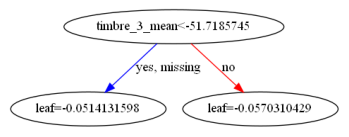

In [40]:
xgb.plot_tree(xg_reg,num_trees=0)
plt.rcParams['figure.figsize'] = [50, 50]
plt.show()

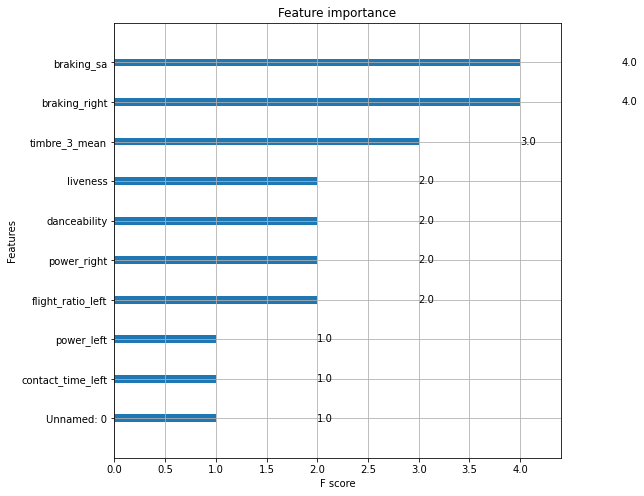

In [42]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [8, 8]
plt.show()